# GMC — Independent Corrections

Each correction is demonstrated in isolation:
1. `fit(raster, stable_mask)` — estimate parameters, inspect `corr.meta`
2. `apply(raster)` — subtract the precomputed surface
3. Static method call — pure array math, no `gu.Raster` needed

**Corrections covered:**
- `MedianCentering`
- `RampCorrection`
- `TopoCorrection` (linear and quadratic)
- `SlopeRampCorrection` (linear and quadratic)
- Guard test: `apply()` before `fit()` raises `RuntimeError`
- `CorrectionPipeline` and `make_corrections`

---
## 0. Setup

In [13]:
import pathlib

import numpy as np
import numpy.ma as ma
import geoutils as gu
import matplotlib.pyplot as plt

import geomulticorr as gmc

from geomulticorr.corrections import (
    CorrectionPipeline, FilterPipeline, make_corrections,
    OutlierFilter, CCFilter, StableAreaMask, SlopeMask,
    MedianCentering, RampCorrection,
    TopoCorrection, SlopeRampCorrection,
    TopoRampCorrection
)

from geomulticorr.utils import (
    plot_disp_vs_elev_raw,
    plot_disp_vs_elev_bins,
    plot_disp_vs_elev_hexbin,
)

In [2]:
session = gmc.open_gmc_session(
    target_directory_path=pathlib.Path('/home/cusicand/03_Data/GMC_projects/MultiSensor'),
    epsg_code=2154,
)

pairs = session.get_pairs()
pair  = [p for p in pairs if p.pa_direction == 'forward'][2]
print(pair.pa_key)

[ GMC ✓ ] : GMC project structure found
[ GMC 🚀 ] : Session 'MultiSensor' initialized.
MontVallon_2019-08-03-planetscope_2020-08-26-planetscope


In [3]:
xDisp = gu.Raster(str(pair.pa_ew_path))
yDisp = gu.Raster(str(pair.pa_ns_path))
cc    = gu.Raster(str(pair.pa_cc_path))

dem_fn   = pathlib.Path('/home/cusicand/03_Data/GMC_projects/MontVallon_Res-0.5_CompElev-mean_merged.tif')
outlines = gu.Vector('/home/cusicand/03_Data/GMC_projects/MontVallon_poly.gpkg')

dem_full = gu.Raster(dem_fn)
dem      = dem_full.reproject(xDisp, resampling='bilinear', res=3)
del dem_full

print(f'xDisp shape: {xDisp.data.shape}  |  dem shape: {dem.data.shape}')

xDisp shape: (1110, 1370)  |  dem shape: (1110, 1370)


---
## 1. Build stable-area mask

`FilterPipeline` chains quality filters (`+`) and produces a boolean mask with `.compute()`.  
The mask is `True` where pixels are **stable** (included in fit) and `False` where they should be excluded.

EW stable pixels: 999,765 / 1,520,700 (65.7%)
NS stable pixels: 931,541 / 1,520,700 (61.3%)


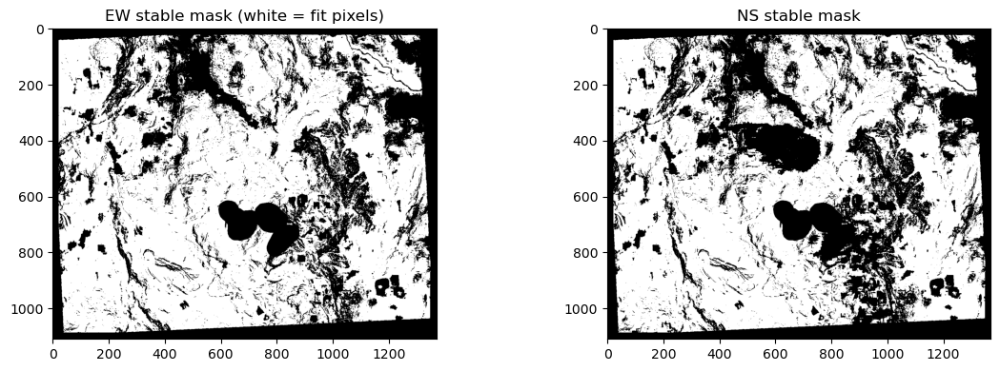

In [4]:
common = CCFilter(0.5) + SlopeMask(max_slope=40) + StableAreaMask(outlines.buffer(50))

x_stable = (
    common.compute(xDisp, cc=cc, dem=dem)
    & OutlierFilter((-10, 10)).generate_mask(xDisp)
)
y_stable = (
    common.compute(yDisp, cc=cc, dem=dem)
    & OutlierFilter((-10, 10)).generate_mask(yDisp)
)

print(f'EW stable pixels: {x_stable.sum():,} / {x_stable.size:,} '
      f'({x_stable.mean()*100:.1f}%)')
print(f'NS stable pixels: {y_stable.sum():,} / {y_stable.size:,} '
      f'({y_stable.mean()*100:.1f}%)')

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
axs[0].imshow(x_stable, cmap='gray')
axs[0].set_title('EW stable mask (white = fit pixels)')
axs[1].imshow(y_stable, cmap='gray')
axs[1].set_title('NS stable mask')
plt.tight_layout()
plt.show()

---
## Helper: before / after plot

In [5]:
def plot_before_after(before, after, stable_mask, title, vmax=5, cmap='RdYlBu'):
    """Four-panel: raw | stable pixels | corrected | distribution."""
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))

    before.plot(ax=axs[0], cmap=cmap, vmin=-vmax, vmax=vmax)
    axs[0].set_title('Before')

    axs[1].imshow(stable_mask, cmap='gray')
    axs[1].set_title('Stable pixels used for fit')

    after.plot(ax=axs[2], cmap=cmap, vmin=-vmax, vmax=vmax)
    axs[2].set_title('After')

    valid_b = before.data[~before.data.mask].flatten()
    valid_a = after.data[~after.data.mask].flatten()
    axs[3].hist(valid_b, bins=60, alpha=0.5, color='steelblue', label='Before')
    axs[3].hist(valid_a, bins=60, alpha=0.5, color='green',    label='After')
    axs[3].axvline(0, color='k', lw=0.8, ls='--')
    axs[3].set_title('Distribution')
    axs[3].legend()

    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()

---
## 2. Guard: `apply()` before `fit()` raises `RuntimeError`

Every correction enforces the fit-before-apply contract.

In [6]:
for cls in (MedianCentering, RampCorrection, TopoCorrection, SlopeRampCorrection):
    try:
        cls().apply(xDisp)
        print(f'{cls.__name__}: NO error raised — unexpected!')
    except RuntimeError as e:
        print(f'{cls.__name__}: guard OK — {e}')

MedianCentering: guard OK — Call fit() before apply() on MedianCentering.
RampCorrection: guard OK — Call fit() before apply() on RampCorrection.
TopoCorrection: guard OK — Call fit() before apply() on TopoCorrection.
SlopeRampCorrection: guard OK — Call fit() before apply() on SlopeRampCorrection.


---
## 3. `MedianCentering`

Subtracts the median (or mean) displacement estimated on stable pixels.  
The fitted surface is a scalar — it broadcasts to every pixel on `apply()`.

In [7]:
# Static method: pure array math — no gu.Raster needed
shift = MedianCentering._compute_shift(xDisp.data, x_stable, stat='median')
print(f'EW median shift (static): {shift:.4f} m')
shift = MedianCentering._compute_shift(yDisp.data, y_stable, stat='median')
print(f'NS median shift (static): {shift:.4f} m')

EW median shift (static): 4.6803 m
NS median shift (static): 3.1091 m


EW meta: {'shift': 4.680273056030273}


/home/cusicand/miniconda3/envs/gmc_env/lib/python3.12/site-packages/geoutils/raster/raster.py:1860: UserWarning: Unmasked values equal to the nodata value found in data array. They are now masked.
 If this happened when creating or updating the array, to silence this warning, convert nodata values in the array to np.nan or mask them with np.ma.masked prior to creating or updating the raster.
If this happened during a numerical operation, use astype() prior to the operation to convert to a data type that won't derive the nodata values (e.g., a float type).
  warnings.warn(


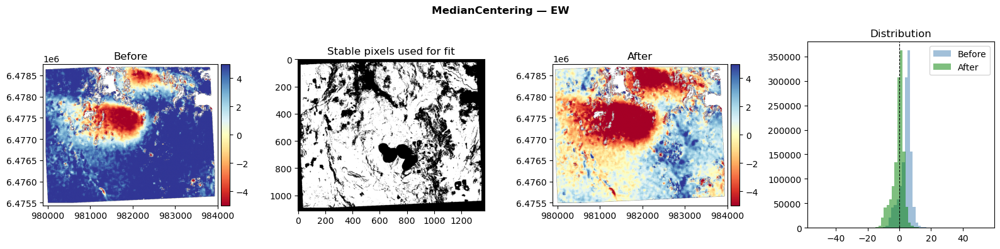

In [8]:
mc_ew = MedianCentering(stat='median')
mc_ew.fit(xDisp, stable_mask=x_stable)

print('EW meta:', mc_ew.meta)

xDisp_mc = mc_ew.apply(xDisp)
plot_before_after(xDisp, xDisp_mc, x_stable, 'MedianCentering — EW')

NS meta: {'shift': 3.10909366607666}


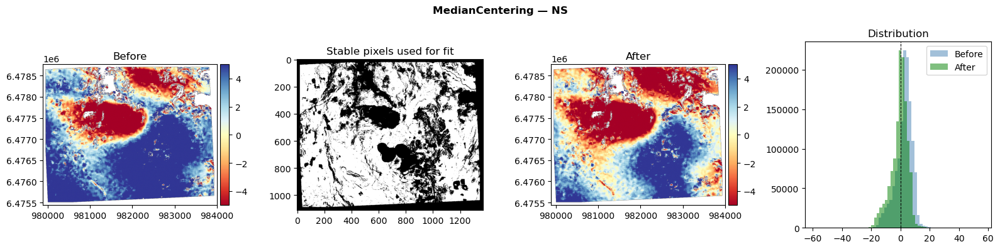

In [9]:
mc_ns = MedianCentering(stat='median')
mc_ns.fit(yDisp, stable_mask=y_stable)

print('NS meta:', mc_ns.meta)

yDisp_mc = mc_ns.apply(yDisp)
plot_before_after(yDisp, yDisp_mc, y_stable, 'MedianCentering — NS')

In [10]:
# fit_and_apply: one-liner convenience
xDisp_mc2 = MedianCentering().fit_and_apply(xDisp, stable_mask=x_stable)
print('fit_and_apply result is identical to fit().apply():', 
      np.allclose(
          ma.filled(xDisp_mc.data, 0),
          ma.filled(xDisp_mc2.data, 0)
      ))

fit_and_apply result is identical to fit().apply(): True


---
## 4. Analyzing elevation-dependant relatiosn on `xDisp` and `yDisp`

In [11]:
dem_arr  = ma.filled(dem.data, np.nan).astype(float)

# Valid stable pixels that also have a finite DEM value
fit_mask = x_stable & np.isfinite(dem_arr) & ~np.ma.getmaskarray(xDisp_mc.data)

disp_vals = xDisp_mc.data.data[fit_mask]   # 1-D array, raw pixel values
elev_vals = dem_arr[fit_mask]           # 1-D array, same pixels


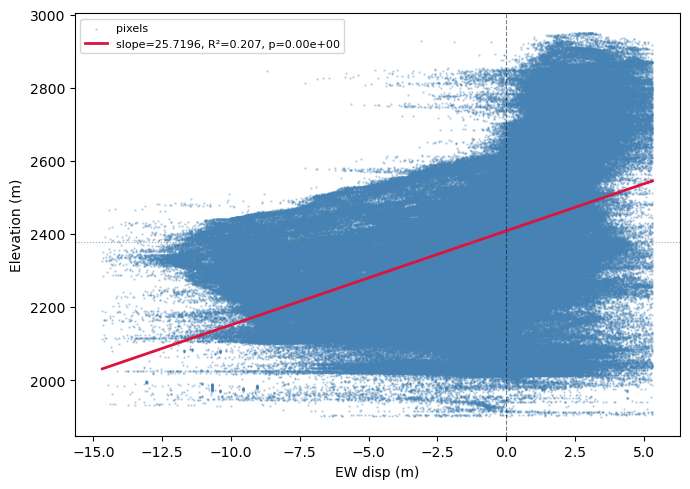

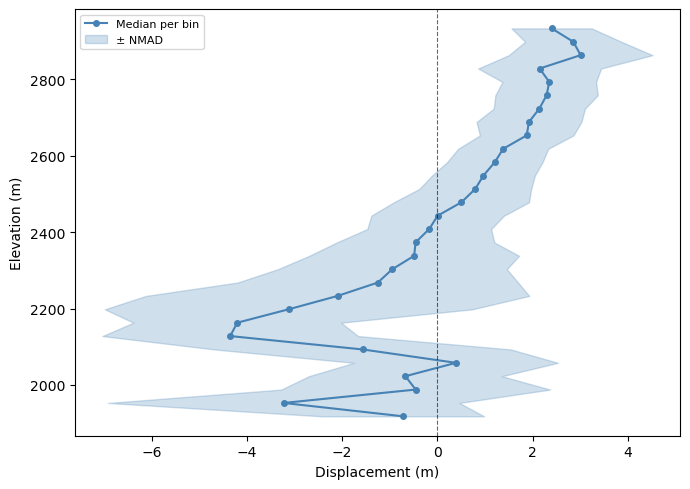

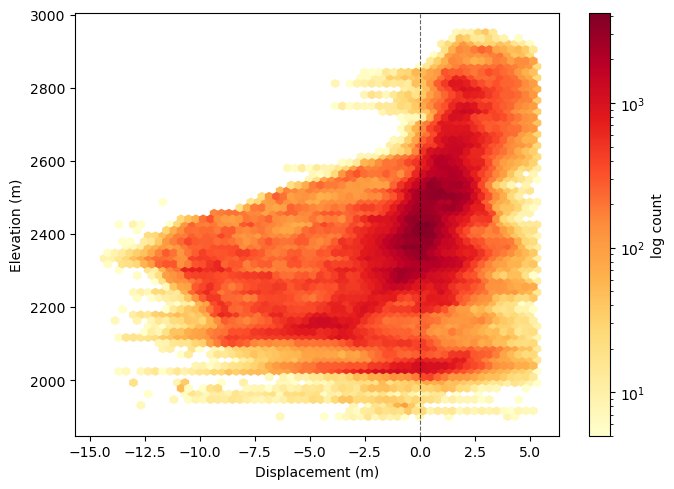

In [12]:
fig, ax = plot_disp_vs_elev_raw(disp_vals, elev_vals, xlabel="EW disp (m)")
fig, ax = plot_disp_vs_elev_bins(disp_vals, elev_vals, n_bins=30)
fig, ax = plot_disp_vs_elev_hexbin(disp_vals, elev_vals, gridsize=60)

In [31]:
corr_lin = TopoRampCorrection(order="linear")

In [32]:
corr_lin.fit(xDisp_mc, stable_mask=x_stable, dem=dem)

TopoRampCorrection()

In [33]:
print(corr_lin.meta)   # {"a": ..., "b": ..., "c": ..., "d": ..., "r2": ...}

{'a': 0.0018334559263733729, 'b': 0.0013830674968651612, 'c': 0.005754080924957763, 'd': -16.592384556416786, 'r2': 0.24080165812273047}


In [34]:
xc = corr_lin.apply(xDisp_mc)

In [ ]:
# Valid stable pixels that also have a finite DEM value
fit_mask = x_stable & np.isfinite(dem_arr) & ~np.ma.getmaskarray(xc.data)

disp_vals_xc_lin = xc.data.data[fit_mask]   # 1-D array, corrected pixel values
elev_vals = dem_arr[fit_mask]           # 1-D array, same pixels

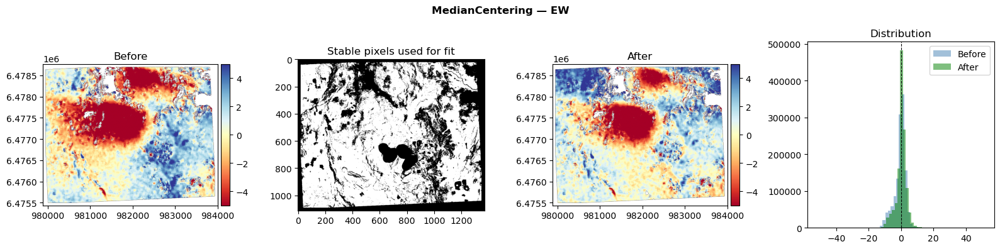

In [36]:
plot_before_after(xDisp_mc, xc, x_stable, 'MedianCentering — EW')

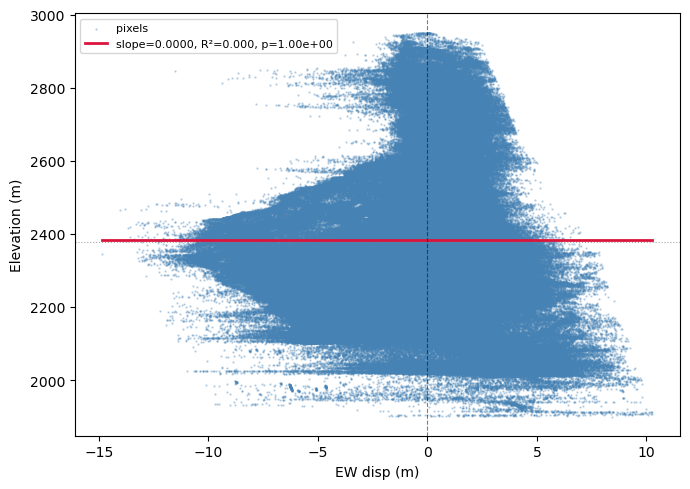

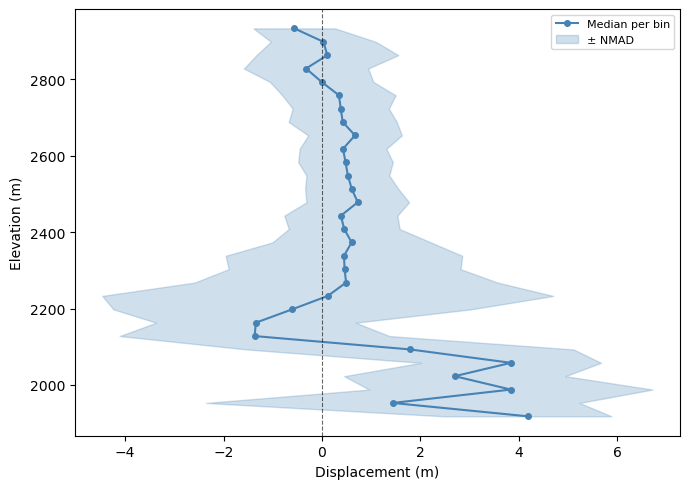

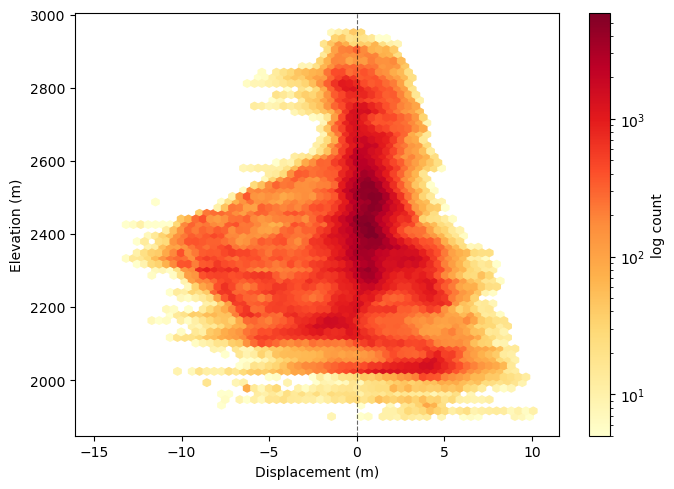

In [37]:
fig, ax = plot_disp_vs_elev_raw(disp_vals_xc_lin, elev_vals, xlabel="EW disp (m)")
fig, ax = plot_disp_vs_elev_bins(disp_vals_xc_lin, elev_vals, n_bins=30)
fig, ax = plot_disp_vs_elev_hexbin(disp_vals_xc_lin, elev_vals, gridsize=60)

In [38]:
corr_quad = TopoRampCorrection(order="quadratic")
corr_quad.fit(xDisp_mc, stable_mask=x_stable, dem=dem)
print(corr_quad.meta)

{'g': -3.104998568920953, 'a2': 0.756961171355582, 'b2': 1.4170696569664383, 'cxy': -0.07954525249079296, 'ax': 0.4072197168638861, 'by': 0.33016856647129184, 'fz': 1.3700034927260085, 'r2': 0.42378994224598776}


In [39]:
xc_quad = corr_quad.apply(xDisp_mc)

In [40]:
# Valid stable pixels that also have a finite DEM value
fit_mask = x_stable & np.isfinite(dem_arr) & ~np.ma.getmaskarray(xc_quad.data)

disp_vals_xc_quad = xc_quad.data.data[fit_mask]   # 1-D array, corrected pixel values
elev_vals = dem_arr[fit_mask]           # 1-D array, same pixels

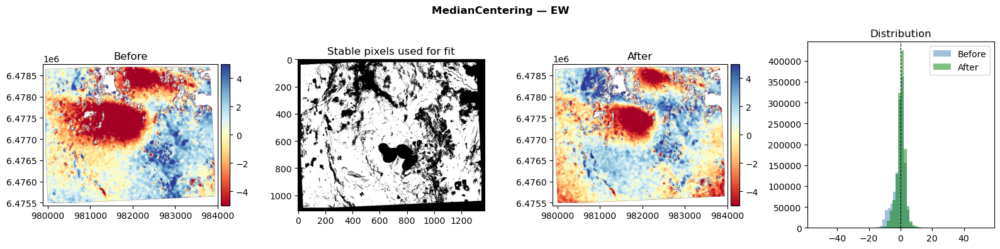

In [41]:
plot_before_after(xDisp_mc, xc_quad, x_stable, 'MedianCentering — EW')

/home/cusicand/05_Devs/GeoMultiCorr/geomulticorr/utils/gmc_functions.py:632: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/home/cusicand/miniconda3/envs/gmc_env/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/cusicand/miniconda3/envs/gmc_env/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


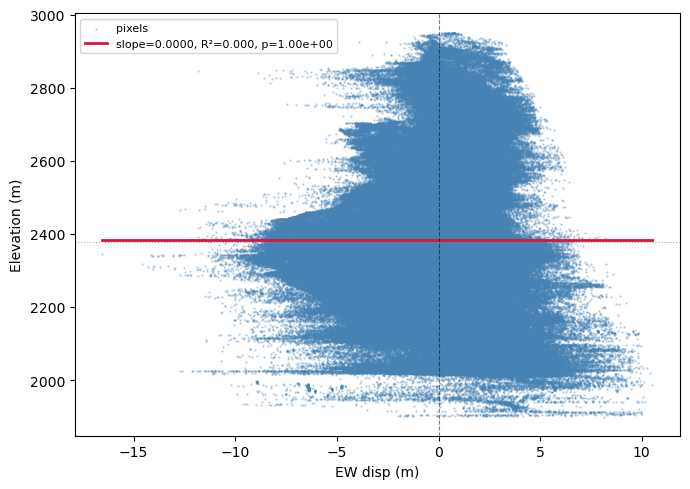

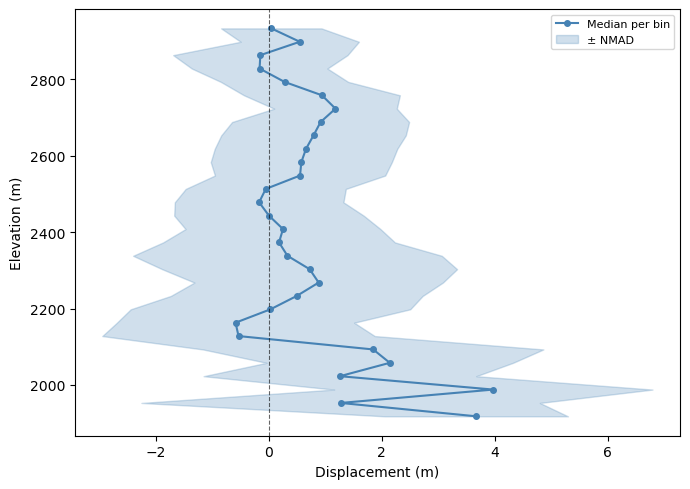

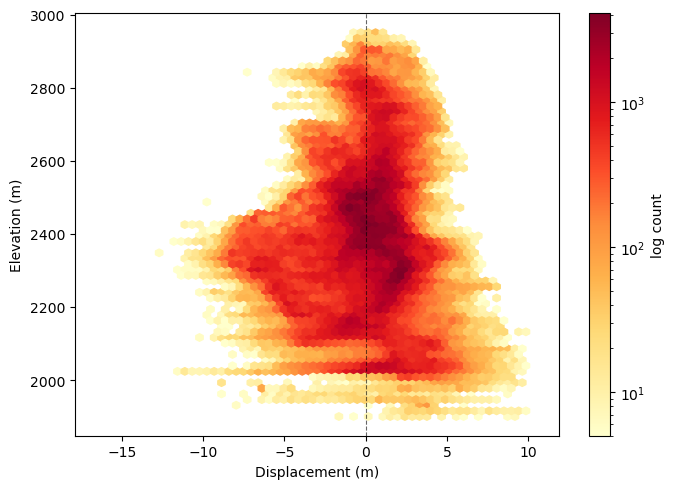

In [42]:
fig, ax = plot_disp_vs_elev_raw(disp_vals_xc_quad, elev_vals, xlabel="EW disp (m)")
fig, ax = plot_disp_vs_elev_bins(disp_vals_xc_quad, elev_vals, n_bins=30)
fig, ax = plot_disp_vs_elev_hexbin(disp_vals_xc_quad, elev_vals, gridsize=60)

---
# Correcting dome effect using slope

In [50]:
disp_vals_xc_lin

array([ 6.86728956, -6.17224623, -6.17982168, ..., -0.29481711,
       -0.36671844, -0.31669691], shape=(999764,))

Text(0.5, 1.0, 'Terrain slope')

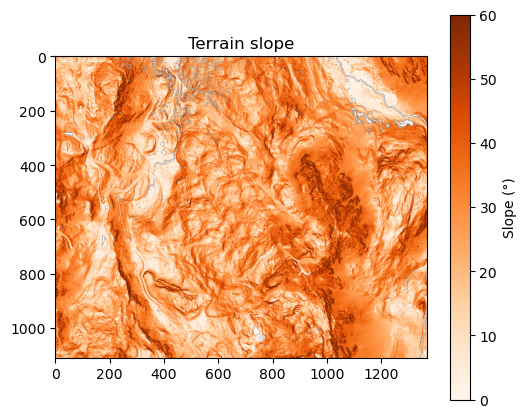

In [51]:
from geomulticorr.corrections import SlopeRampCorrection
import numpy.ma as ma

# Inspect the slope map before fitting
dem_arr = ma.filled(dem.data, np.nan).astype(float)
slope_arr = SlopeRampCorrection._compute_slope(dem_arr, xc.transform)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(slope_arr, cmap='Oranges', vmin=0, vmax=60)
plt.colorbar(im, ax=ax, label='Slope (°)')
ax.set_title('Terrain slope')


In [52]:
corr_slope_ew = SlopeRampCorrection(order="linear")
corr_slope_ew.fit(xc, stable_mask=x_stable, dem=dem)
print(corr_slope_ew.meta)
# {"row_slope": ..., "col_slope": ..., "slope_coeff": ..., "intercept": ..., "r2": ...}

xD_slope = corr_slope_ew.apply(xc)

# # NS — fit independently with its own stable mask
# corr_slope_ns = SlopeRampCorrection(order="linear")
# corr_slope_ns.fit(yc, stable_mask=y_stable, dem=dem)
# print(corr_slope_ns.meta)
# yD_slope = corr_slope_ns.apply(yc)


{'row_slope': 5.547984657110405e-07, 'col_slope': 1.5346145646004312e-06, 'slope_coeff': -0.0008191388773979288, 'intercept': 0.018546588686876888, 'r2': 7.4473672138086755e-06}


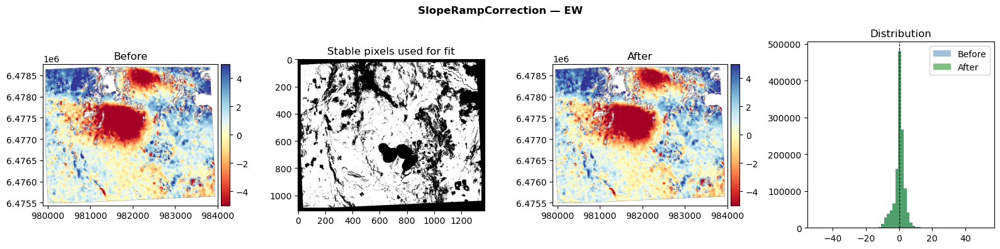

In [55]:
plot_before_after(xc, xD_slope, x_stable, 'SlopeRampCorrection — EW')

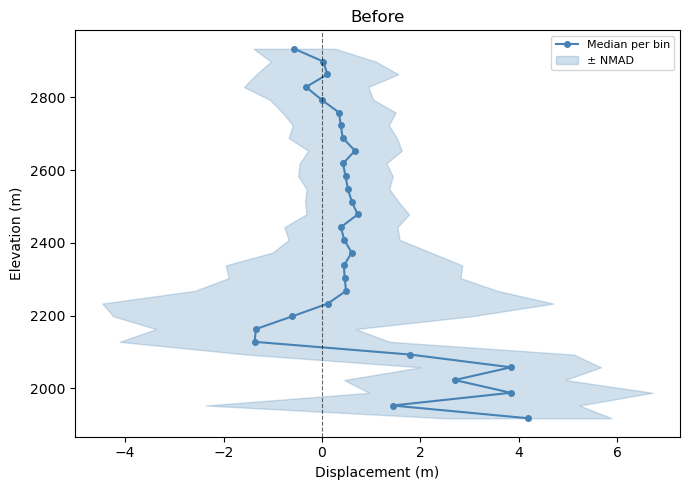

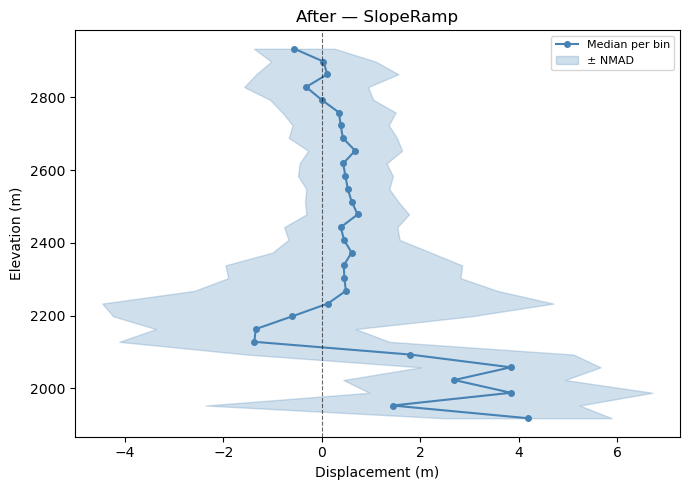

In [53]:
from geomulticorr.utils import plot_disp_vs_elev_bins

fit_mask_ew = x_stable & np.isfinite(dem_arr) & ~np.ma.getmaskarray(xDisp_mc.data)
elev_vals   = dem_arr[fit_mask_ew]

disp_before = ma.filled(xc.data, np.nan)[fit_mask_ew]
disp_after  = ma.filled(xD_slope.data, np.nan)[fit_mask_ew]

# fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
fig, ax = plot_disp_vs_elev_bins(disp_before, elev_vals, fig_name="Before")  # see note
fig, ax = plot_disp_vs_elev_bins(disp_after,  elev_vals, fig_name="After — SlopeRamp")


## RampSlope quadratic

In [57]:
corr_slope_q = SlopeRampCorrection(order="quadratic")
corr_slope_q.fit(xDisp_mc, stable_mask=x_stable, dem=dem)
print(corr_slope_q.meta)
# {"c_bias": ..., "c_row2": ..., "c_col2": ..., "c_rowcol": ...,
#  "c_row": ..., "c_col": ..., "c_slope": ..., "r2": ...}

xD_slope_q = corr_slope_q.apply(xDisp_mc)


{'c_bias': -2.876518624600548, 'c_row2': 0.6102185774399724, 'c_col2': 1.3391763517060091, 'c_rowcol': 0.05587242476195145, 'c_row': 1.3202334164962208, 'c_col': 0.5035107931618359, 'c_slope': 0.2987073952383264, 'r2': 0.34770585390957054}


In [59]:
corr_slope_ew.meta["r2"], corr_slope_q.meta["r2"]

(7.4473672138086755e-06, 0.34770585390957054)

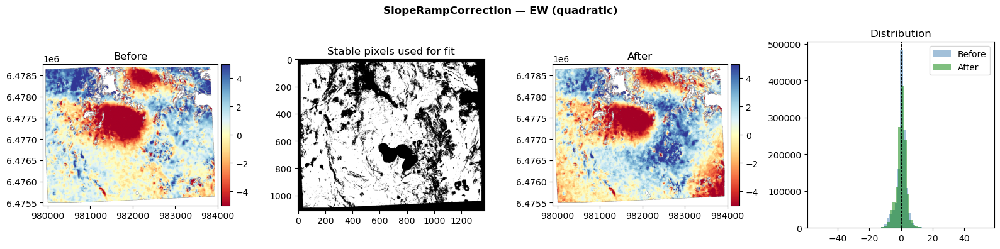

In [60]:
plot_before_after(xc, xD_slope_q, x_stable, 'SlopeRampCorrection — EW (quadratic)')

---
## 4. `RampCorrection`

Fits `a·row + b·col + d` on stable pixels (normalised LS with L2 regularisation).  
The same fitted ramp can be applied to both EW and NS components.

In [16]:
# Static method: fit coefficients directly on masked arrays
a, b, d, r2 = RampCorrection._fit_coefficients(
    xDisp_mc.data, x_stable, lambda_reg=1e-6
)
print(f'Ramp coefficients (static): a={a:.4e}  b={b:.4e}  d={d:.4f}  R²={r2:.4f}')

Ramp coefficients (static): a=nan  b=nan  d=nan  R²=nan


EW meta: {'a': 0.004362594114043017, 'b': 0.0017835377773605485, 'd': -4.603164104929478, 'r2': 0.1909620981167296}


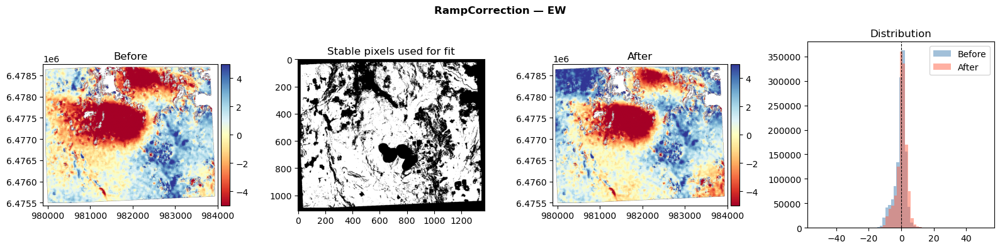

In [19]:
ramp_ew = RampCorrection(lambda_reg=1e-6)
ramp_ew.fit(xDisp_mc, stable_mask=x_stable)

print('EW meta:', ramp_ew.meta)

xDisp_ramp = ramp_ew.apply(xDisp_mc)
plot_before_after(xDisp_mc, xDisp_ramp, x_stable, 'RampCorrection — EW')

NS meta: {'a': 0.008518098634283959, 'b': 0.00035395139081271056, 'd': -5.9183271575743195, 'r2': 0.3527647490212792}


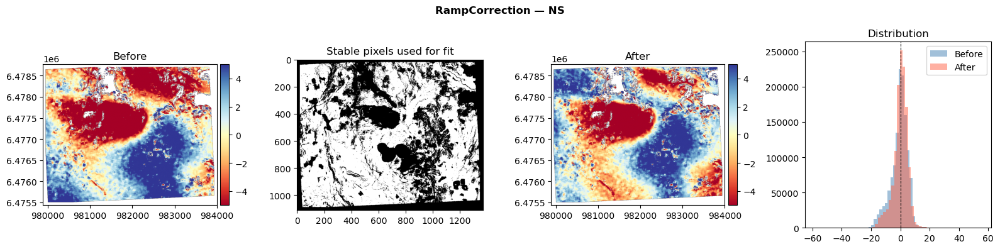

In [20]:
ramp_ns = RampCorrection(lambda_reg=1e-6)
ramp_ns.fit(yDisp_mc, stable_mask=y_stable)

print('NS meta:', ramp_ns.meta)

yDisp_ramp = ramp_ns.apply(yDisp_mc)
plot_before_after(yDisp_mc, yDisp_ramp, y_stable, 'RampCorrection — NS')

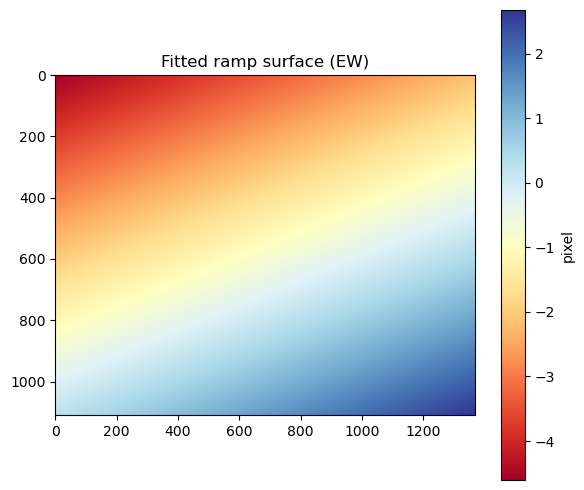

In [21]:
# Inspect the fitted ramp surface directly
fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(ramp_ew._surface, cmap='RdYlBu')
plt.colorbar(im, ax=ax, label='pixel')
ax.set_title('Fitted ramp surface (EW)')
plt.tight_layout()
plt.show()

---
## 5. `TopoCorrection` — linear order

Fits `a·row + b·col + c·DEM + d` jointly.  
Useful when orbital ramp and topographic correlation are entangled.  
The DEM must be pre-resampled to the same grid as the displacement rasters.

EW meta (linear):
  row_slope: -0.002406
  col_slope: -0.000397
  dem_slope: 0.005687
  intercept: -11.927784
  r2: 0.066734


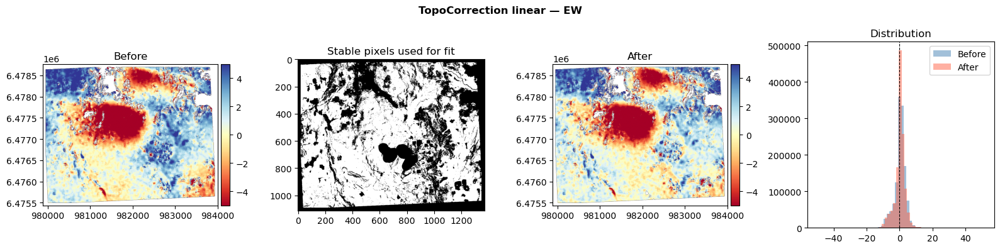

In [22]:
topo_lin_ew = TopoCorrection(order='linear')
topo_lin_ew.fit(xDisp_ramp, stable_mask=x_stable, dem=dem)

print('EW meta (linear):')
for k, v in topo_lin_ew.meta.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

xDisp_topo_lin = topo_lin_ew.apply(xDisp_ramp)
plot_before_after(xDisp_ramp, xDisp_topo_lin, x_stable,
                  'TopoCorrection linear — EW')

NS meta (linear):
  row_slope: -0.005593
  col_slope: -0.000749
  dem_slope: 0.013956
  intercept: -29.500625
  r2: 0.271954


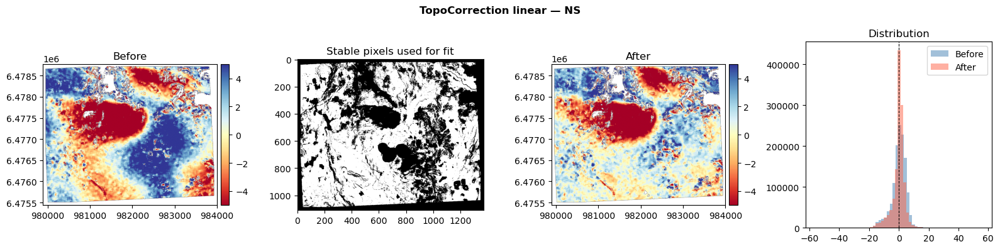

In [23]:
topo_lin_ns = TopoCorrection(order='linear')
topo_lin_ns.fit(yDisp_ramp, stable_mask=y_stable, dem=dem)

print('NS meta (linear):')
for k, v in topo_lin_ns.meta.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

yDisp_topo_lin = topo_lin_ns.apply(yDisp_ramp)
plot_before_after(yDisp_ramp, yDisp_topo_lin, y_stable,
                  'TopoCorrection linear — NS')

---
## 6. `TopoCorrection` — quadratic order

Fits `a·row² + b·col² + c·row·col + d·row + e·col + f·DEM + g`.  
Use when the orbital ramp has curvature (long baselines, wide-swath sensors).

EW meta (quadratic):
  c_bias: -2.176542
  c_row2: 0.755410
  c_col2: 1.418663
  c_rowcol: -0.070939
  c_row: -0.841612
  c_col: -0.333981
  c_dem: 1.342482
  r2: 0.298061


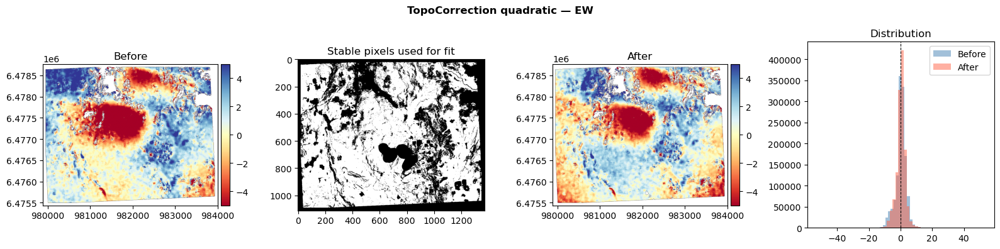

In [24]:
topo_quad_ew = TopoCorrection(order='quadratic')
topo_quad_ew.fit(xDisp_ramp, stable_mask=x_stable, dem=dem)

print('EW meta (quadratic):')
for k, v in topo_quad_ew.meta.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

xDisp_topo_quad = topo_quad_ew.apply(xDisp_ramp)
plot_before_after(xDisp_ramp, xDisp_topo_quad, x_stable,
                  'TopoCorrection quadratic — EW')

In [25]:
# Static method: fit linear topo model directly on arrays
import numpy.ma as ma
dem_arr = ma.filled(dem.data, np.nan).astype(float)

coeffs_lin, surface_lin = TopoCorrection._fit_linear(
    xDisp_ramp.data, dem_arr, x_stable, lambda_reg=1e-6
)
print('Coefficients from static _fit_linear:')
for k, v in coeffs_lin.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

Coefficients from static _fit_linear:
  row_slope: nan
  col_slope: nan
  dem_slope: nan
  intercept: nan
  r2: nan


---
## 7. `SlopeRampCorrection` — linear order

Fits `a·row + b·col + c·slope + d` where **slope** is terrain gradient magnitude in degrees.  
Use this instead of `TopoCorrection` when errors are caused by orthorectification parallax
(look-angle × slope), not by elevation.

Slope range: nan° – nan°  (mean: nan°)


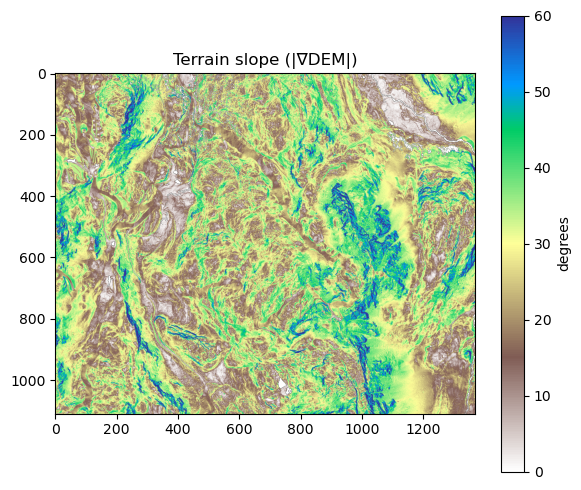

In [26]:
# Static method: compute terrain slope without fitting anything
slope = SlopeRampCorrection._compute_slope(
    ma.filled(dem.data, np.nan).astype(float),
    dem.transform,
)
print(f'Slope range: {slope.min():.2f}° – {slope.max():.2f}°  '
      f'(mean: {slope.mean():.2f}°)')

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(slope, cmap='terrain_r', vmin=0, vmax=60)
plt.colorbar(im, ax=ax, label='degrees')
ax.set_title('Terrain slope (|∇DEM|)')
plt.tight_layout()
plt.show()

EW meta (linear slope ramp):
  row_slope: -0.000013
  col_slope: -0.000039
  slope_coeff: 0.021520
  intercept: -0.490898
  r2: 0.004837


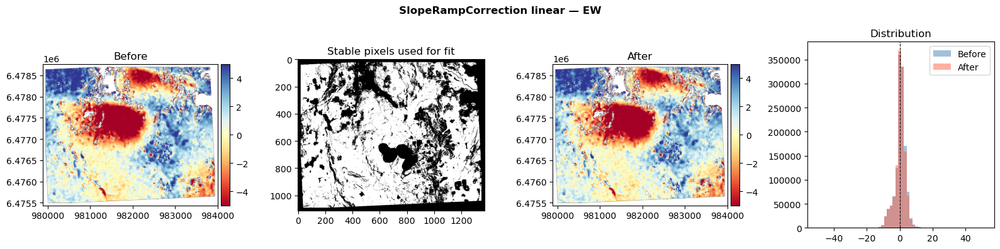

In [27]:
src_lin_ew = SlopeRampCorrection(order='linear')
src_lin_ew.fit(xDisp_ramp, stable_mask=x_stable, dem=dem)

print('EW meta (linear slope ramp):')
for k, v in src_lin_ew.meta.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

xDisp_src_lin = src_lin_ew.apply(xDisp_ramp)
plot_before_after(xDisp_ramp, xDisp_src_lin, x_stable,
                  'SlopeRampCorrection linear — EW')

NS meta (linear slope ramp):
  row_slope: -0.000029
  col_slope: -0.000096
  slope_coeff: 0.060190
  intercept: -1.381609
  r2: 0.027692


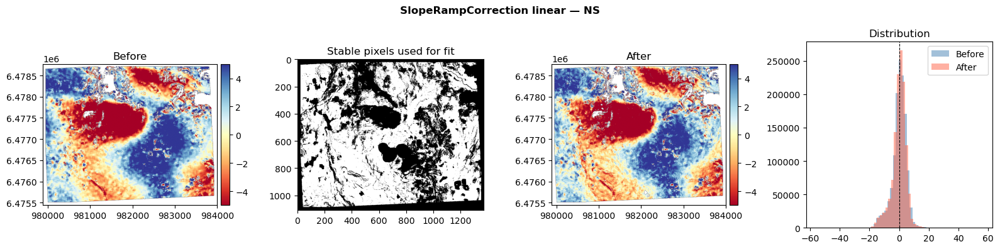

In [28]:
src_lin_ns = SlopeRampCorrection(order='linear')
src_lin_ns.fit(yDisp_ramp, stable_mask=y_stable, dem=dem)

print('NS meta (linear slope ramp):')
for k, v in src_lin_ns.meta.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

yDisp_src_lin = src_lin_ns.apply(yDisp_ramp)
plot_before_after(yDisp_ramp, yDisp_src_lin, y_stable,
                  'SlopeRampCorrection linear — NS')

---
## 8. `SlopeRampCorrection` — quadratic order

EW meta (quadratic slope ramp):
  c_bias: -1.957326
  c_row2: 0.616066
  c_col2: 1.343485
  c_rowcol: 0.063896
  c_row: 0.051156
  c_col: -0.160405
  c_slope: 0.285023
  r2: 0.206144


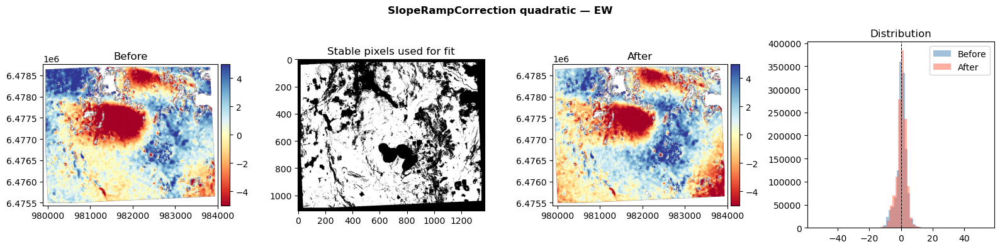

In [29]:
src_quad_ew = SlopeRampCorrection(order='quadratic')
src_quad_ew.fit(xDisp_ramp, stable_mask=x_stable, dem=dem)

print('EW meta (quadratic slope ramp):')
for k, v in src_quad_ew.meta.items():
    print(f'  {k}: {v:.6f}' if isinstance(v, float) else f'  {k}: {v}')

xDisp_src_quad = src_quad_ew.apply(xDisp_ramp)
plot_before_after(xDisp_ramp, xDisp_src_quad, x_stable,
                  'SlopeRampCorrection quadratic — EW')

---
## 9. Compare all corrections on EW

NMAD on stable pixels before and after each correction.

In [ ]:
import xdem  # for xdem.spatialstats.nmad

def nmad_stable(raster, mask):
    vals = raster.data.data[mask & ~np.ma.getmaskarray(raster.data)]
    return float(1.4826 * np.median(np.abs(vals - np.median(vals))))

results = {
    'Raw':                          xDisp,
    'MedianCentering':              xDisp_mc,
    'MC + RampCorrection':          xDisp_ramp,
    'MC + Ramp + Topo(linear)':     xDisp_topo_lin,
    'MC + Ramp + Topo(quadratic)':  xDisp_topo_quad,
    'MC + Ramp + Slope(linear)':    xDisp_src_lin,
    'MC + Ramp + Slope(quadratic)': xDisp_src_quad,
}

print(f'{"Step":<35}  NMAD (m)')
print('-' * 48)
for label, raster in results.items():
    print(f'{label:<35}  {nmad_stable(raster, x_stable):.4f}')

Step                                 NMAD (px)
------------------------------------------------
Raw                                  2.3019
MedianCentering                      2.3019
MC + RampCorrection                  2.0330
MC + Ramp + Topo(linear)             1.6342
MC + Ramp + Topo(quadratic)          2.0434
MC + Ramp + Slope(linear)            2.0138
MC + Ramp + Slope(quadratic)         2.1480


---
## 10. `CorrectionPipeline`

Chain corrections with `+`.  Each step is fitted on the residual of the previous.  
`pipeline.meta` collects per-step diagnostics after `fit()`.

In [31]:
pipeline = MedianCentering() + RampCorrection() + TopoCorrection(order='quadratic')
print(pipeline)

CorrectionPipeline([MedianCentering -> RampCorrection -> TopoCorrection])


In [32]:
pipeline.fit(xDisp, stable_mask=x_stable, dem=dem)

import pprint
pprint.pprint(pipeline.meta)

/home/cusicand/miniconda3/envs/gmc_env/lib/python3.12/site-packages/geoutils/raster/raster.py:1860: UserWarning: Unmasked values equal to the nodata value found in data array. They are now masked.
 If this happened when creating or updating the array, to silence this warning, convert nodata values in the array to np.nan or mask them with np.ma.masked prior to creating or updating the raster.
If this happened during a numerical operation, use astype() prior to the operation to convert to a data type that won't derive the nodata values (e.g., a float type).
  warnings.warn(


{0: {'params': {'shift': 4.689895391464233}, 'step': 'MedianCentering'},
 1: {'params': {'a': 0.004362594114043017,
                'b': 0.0017835377773605485,
                'd': -4.603164104929478,
                'r2': 0.1909620981167296},
     'step': 'RampCorrection'},
 2: {'params': {'c_bias': -2.176542343127046,
                'c_col': -0.3339810208023484,
                'c_col2': 1.4186625107344484,
                'c_dem': 1.3424822512284023,
                'c_row': -0.8416117548665556,
                'c_row2': 0.7554096495570978,
                'c_rowcol': -0.0709391536904877,
                'r2': 0.2980611554329047},
     'step': 'TopoCorrection'}}


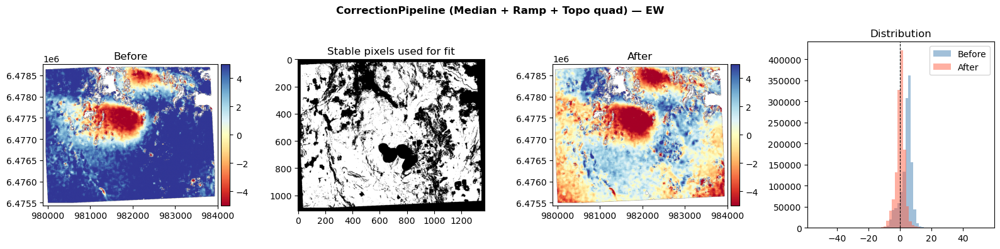

In [33]:
xc_pipeline = pipeline.apply(xDisp)
plot_before_after(xDisp, xc_pipeline, x_stable,
                  'CorrectionPipeline (Median + Ramp + Topo quad) — EW')

In [34]:
# Verify: fit_and_apply produces the same result as fit().apply()
pipeline2 = MedianCentering() + RampCorrection() + TopoCorrection(order='quadratic')
xc2 = pipeline2.fit_and_apply(xDisp, stable_mask=x_stable, dem=dem)

identical = np.allclose(
    ma.filled(xc_pipeline.data, 0),
    ma.filled(xc2.data, 0)
)
print(f'fit().apply() == fit_and_apply(): {identical}')

fit().apply() == fit_and_apply(): True


---
## 11. `make_corrections` — independent per component

`make_corrections` deep-copies the pipeline so EW and NS are fitted independently
(different stable masks, different fitted surfaces).

In [35]:
shared_pipeline = (
    MedianCentering()
    + RampCorrection()
    + TopoCorrection(order='quadratic')
)

xc, yc = make_corrections(
    xDisp, yDisp,
    shared_pipeline,
    x_stable=x_stable,
    y_stable=y_stable,
    dem=dem,
)

print(f'EW NMAD before: {nmad_stable(xDisp, x_stable):.4f}  '
      f'after: {nmad_stable(xc, x_stable):.4f}')
print(f'NS NMAD before: {nmad_stable(yDisp, y_stable):.4f}  '
      f'after: {nmad_stable(yc, y_stable):.4f}')

EW NMAD before: 2.3019  after: 2.0434
NS NMAD before: 3.8201  after: 2.1483


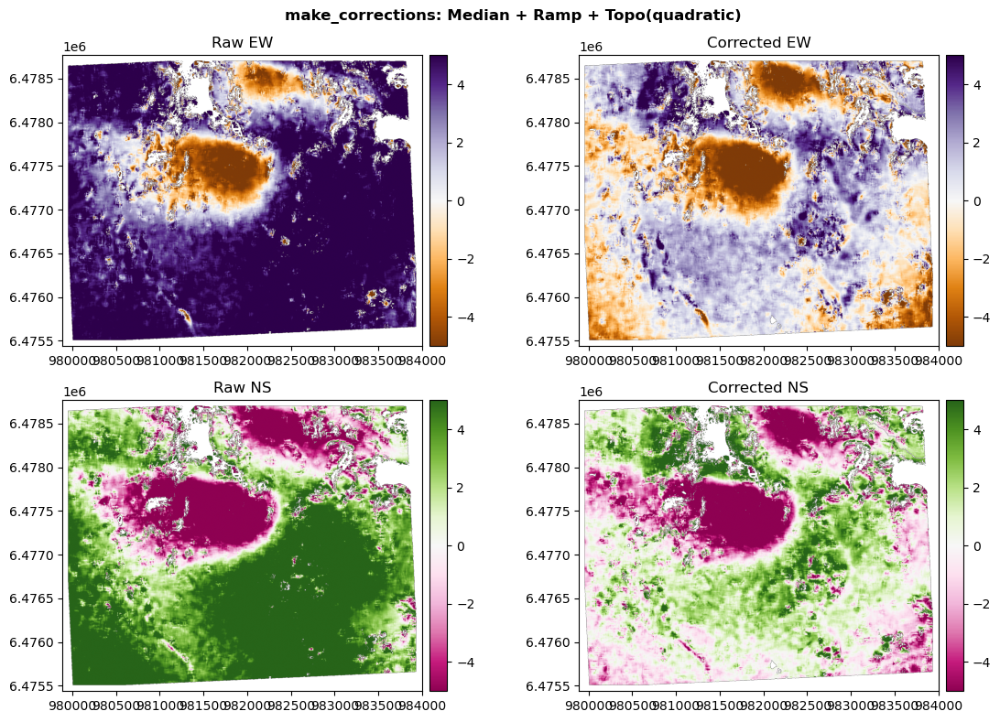

In [36]:
vmax = 5
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
xDisp.plot(ax=axs[0, 0], cmap='PuOr', vmin=-vmax, vmax=vmax)
axs[0, 0].set_title('Raw EW')
xc.plot(ax=axs[0, 1], cmap='PuOr', vmin=-vmax, vmax=vmax)
axs[0, 1].set_title('Corrected EW')
yDisp.plot(ax=axs[1, 0], cmap='PiYG', vmin=-vmax, vmax=vmax)
axs[1, 0].set_title('Raw NS')
yc.plot(ax=axs[1, 1], cmap='PiYG', vmin=-vmax, vmax=vmax)
axs[1, 1].set_title('Corrected NS')
plt.suptitle('make_corrections: Median + Ramp + Topo(quadratic)', fontweight='bold')
plt.tight_layout()
plt.show()